# DL LAB06 GAN MODEL ON CELEB DATASET
## ARYAN BHARDWAJ EC22B1117


In [1]:
import os
import datetime
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
from PIL import Image
from IPython.display import display
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.optim.lr_scheduler import StepLR
from torchsummary import summary
from tqdm import tqdm
import torchvision.models as models
import PIL
from torchvision.models import resnet50, ResNet50_Weights
import timm
from torch.utils.data import Dataset
import glob
import random
import torchvision

In [2]:
data_path = '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba'

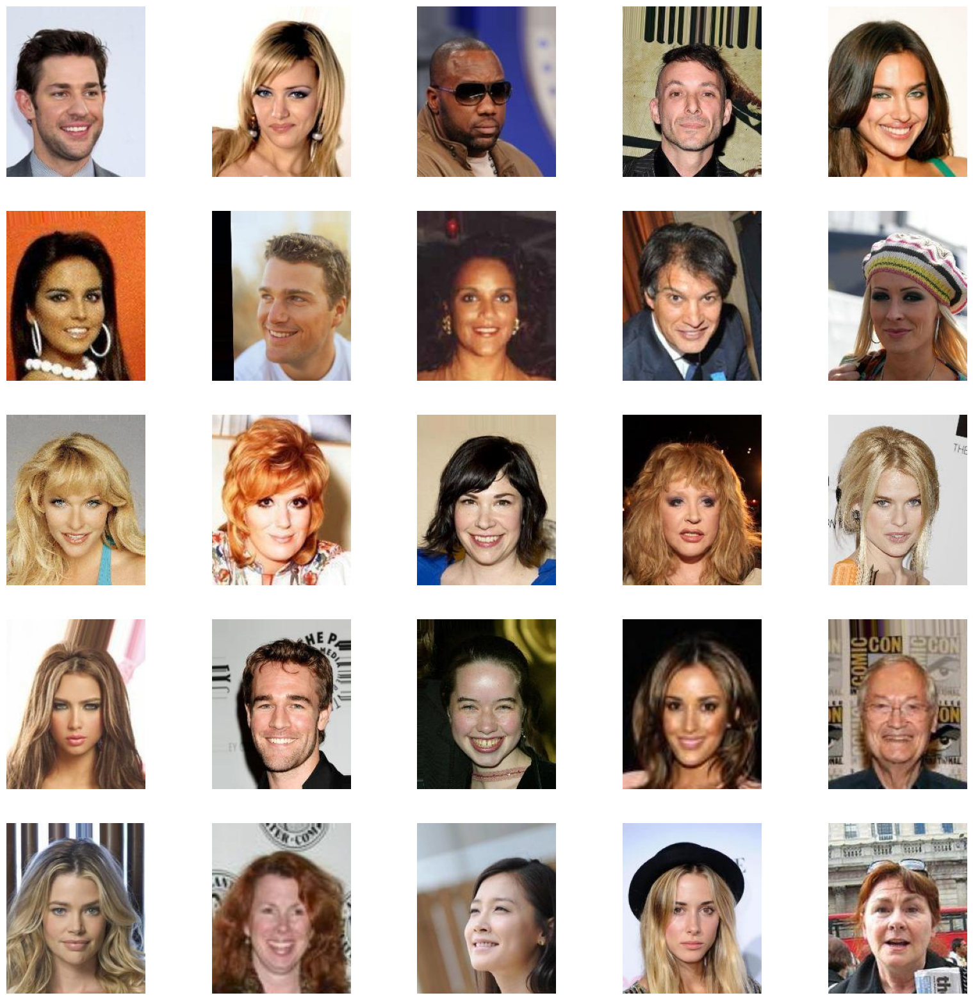

In [3]:
plt.figure(figsize=(20, 20))
for i, file in enumerate(os.listdir(data_path)[0:25]):
    fullpath = data_path + "/" + file
    img=mpimg.imread(fullpath)
    ax=plt.subplot(5,5,i+1)
    plt.axis('off')
    plt.imshow(img)

In [4]:
class CelebADataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, img) for img in os.listdir(root_dir) if img.endswith('.jpg')]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        return image

In [5]:
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

dataset = CelebADataset(root_dir=data_path, transform=transform)

dataloader = DataLoader(dataset, batch_size=512, shuffle=True, pin_memory= True, num_workers=3)

print(f"Total number of images loaded: {len(dataset)}")

Total number of images loaded: 202599


In [6]:
class Generator(nn.Module):
    def __init__(self, z_dim=100, img_channels=3):
        super(Generator, self).__init__()
        self.linear = nn.Linear(z_dim, 1024*4*4)
        
        self.conv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride =2)
        self.conv1_bn = nn.BatchNorm2d(512)
        self.conv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride =2)
        self.conv2_bn = nn.BatchNorm2d(256)
        self.conv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride =2)
        self.conv3_bn = nn.BatchNorm2d(128)
        self.conv4 = nn.ConvTranspose2d(128, 3, kernel_size=2, stride =2)
        self.relu = nn.ReLU()

    def forward(self, z):
        img = self.linear(z)
        img = img.view(img.size(0), 1024, 4, 4)
        img = self.relu(self.conv1_bn(self.conv1(img)))
        img = self.relu(self.conv2_bn(self.conv2(img)))
        img = self.relu(self.conv3_bn(self.conv3(img)))
        img = self.conv4(img)
        return img

In [7]:
class Discriminator(nn.Module):
    def __init__(self, img_channels=3):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(img_channels * 64 * 64, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, img):
        return self.model(img)

In [8]:
adversarial_loss = nn.BCELoss()
generator = Generator(z_dim=100)
discriminator = Discriminator()
optimizer_G = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
generator = generator.to(device)
discriminator = discriminator.to(device)

In [9]:
g_accumulated_loss = []
d_accumulated_loss = []

In [10]:
def save_generated_images(generator, epoch, device, num_images=16):
    z = torch.randn(num_images, 100).to(device)
    generated_imgs = generator(z).detach().cpu()
    grid = torchvision.utils.make_grid(generated_imgs, nrow=4, normalize=True)
    plt.imshow(np.transpose(grid, (1, 2, 0)))
    plt.title(f"Epoch {epoch}")
    plt.axis('off')
    plt.show()

In [11]:
def train(generator, discriminator, dataloader, epochs=5):
    g_total_loss = 0.0
    d_total_loss = 0.0
    pbar = tqdm(dataloader)
    for epoch in range(epochs):
        for i, imgs in enumerate(pbar):
            real_imgs = imgs.to(device)
            batch_size = real_imgs.size(0)
            valid = torch.ones(batch_size, 1).to(device)
            fake = torch.zeros(batch_size, 1).to(device)

            optimizer_D.zero_grad()
            real_loss = adversarial_loss(discriminator(real_imgs), valid)
            fake_loss = adversarial_loss(discriminator(generator(torch.randn(batch_size, 100).to(device)).detach()), fake)
            d_loss = (real_loss + fake_loss) / 2
            d_total_loss = d_total_loss + d_loss.item()
            d_loss.backward()
            optimizer_D.step()

            optimizer_G.zero_grad()
            g_loss = adversarial_loss(discriminator(generator(torch.randn(batch_size, 100).to(device))), valid)
            g_total_loss = g_total_loss + g_loss.item()
            g_loss.backward()
            optimizer_G.step()

            if i % 100 == 0:
                print(f"[Epoch {epoch}/{epochs}] [Batch {i}/{len(dataloader)}] [D loss: {d_loss.item()}] [G loss: {g_loss.item()}]")

        save_generated_images(generator, epoch, device)
        g_accumulated_loss.append(g_total_loss)
        d_accumulated_loss.append(d_total_loss)

  0%|          | 1/396 [00:07<50:42,  7.70s/it]

[Epoch 0/50] [Batch 0/396] [D loss: 0.7027230262756348] [G loss: 1.8245396614074707]


 26%|██▌       | 101/396 [03:02<08:25,  1.71s/it]

[Epoch 0/50] [Batch 100/396] [D loss: 0.05242873355746269] [G loss: 6.5728044509887695]


 51%|█████     | 201/396 [06:09<04:50,  1.49s/it]

[Epoch 0/50] [Batch 200/396] [D loss: 0.019055981189012527] [G loss: 8.595002174377441]


 76%|███████▌  | 301/396 [09:14<03:37,  2.29s/it]

[Epoch 0/50] [Batch 300/396] [D loss: 0.5609772205352783] [G loss: 0.5004549026489258]


100%|██████████| 396/396 [12:01<00:00,  1.82s/it]


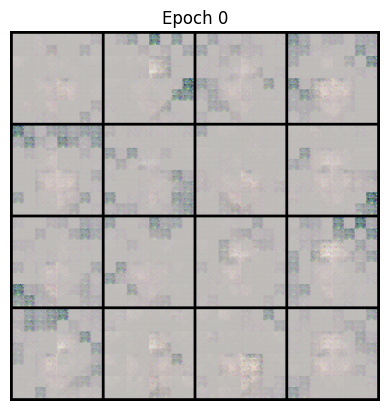

[Epoch 1/50] [Batch 0/396] [D loss: 0.39638862013816833] [G loss: 2.3888330459594727]
[Epoch 1/50] [Batch 100/396] [D loss: 0.40615737438201904] [G loss: 1.2753932476043701]
[Epoch 1/50] [Batch 200/396] [D loss: 0.5010011196136475] [G loss: 1.5322456359863281]
[Epoch 1/50] [Batch 300/396] [D loss: 0.596098780632019] [G loss: 1.121623158454895]


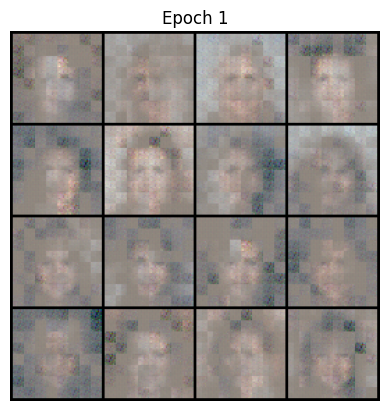

[Epoch 2/50] [Batch 0/396] [D loss: 0.6249926686286926] [G loss: 1.2088100910186768]
[Epoch 2/50] [Batch 100/396] [D loss: 0.6050781011581421] [G loss: 2.214439868927002]
[Epoch 2/50] [Batch 200/396] [D loss: 0.5389561653137207] [G loss: 2.010580539703369]
[Epoch 2/50] [Batch 300/396] [D loss: 0.5586729049682617] [G loss: 2.1450114250183105]


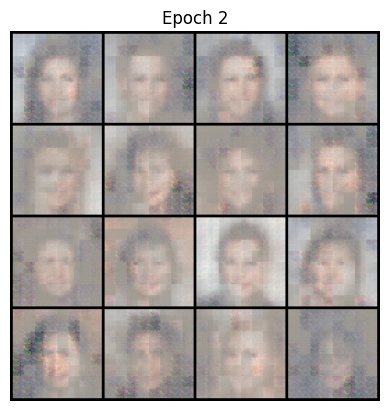

[Epoch 3/50] [Batch 0/396] [D loss: 0.5727289319038391] [G loss: 1.6962145566940308]
[Epoch 3/50] [Batch 100/396] [D loss: 0.5404074192047119] [G loss: 1.7651368379592896]
[Epoch 3/50] [Batch 200/396] [D loss: 0.554794192314148] [G loss: 1.1928226947784424]
[Epoch 3/50] [Batch 300/396] [D loss: 0.5592806339263916] [G loss: 1.1202423572540283]


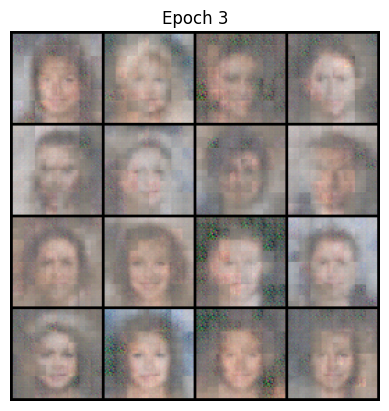

[Epoch 4/50] [Batch 0/396] [D loss: 0.5519969463348389] [G loss: 1.1868562698364258]
[Epoch 4/50] [Batch 100/396] [D loss: 0.6334342360496521] [G loss: 0.9880676865577698]
[Epoch 4/50] [Batch 200/396] [D loss: 0.5398180484771729] [G loss: 1.3561220169067383]
[Epoch 4/50] [Batch 300/396] [D loss: 0.6655478477478027] [G loss: 1.3885135650634766]


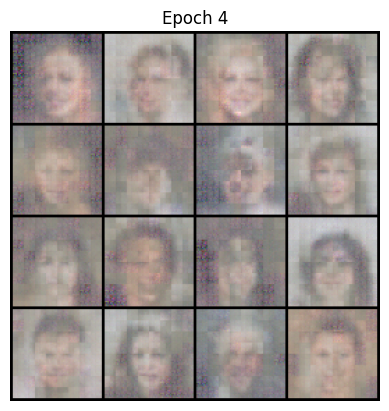

[Epoch 5/50] [Batch 0/396] [D loss: 0.5421096682548523] [G loss: 1.1869640350341797]
[Epoch 5/50] [Batch 100/396] [D loss: 0.6443198919296265] [G loss: 1.434268593788147]
[Epoch 5/50] [Batch 200/396] [D loss: 0.5769120454788208] [G loss: 1.3813252449035645]
[Epoch 5/50] [Batch 300/396] [D loss: 0.5727280378341675] [G loss: 1.54432213306427]


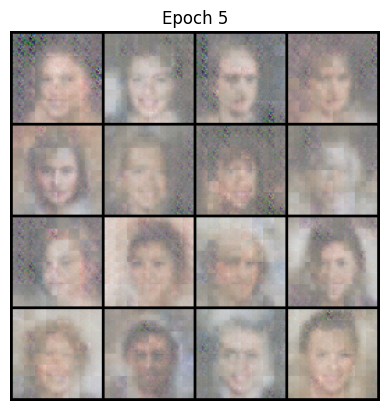

[Epoch 6/50] [Batch 0/396] [D loss: 0.562034010887146] [G loss: 1.3848623037338257]
[Epoch 6/50] [Batch 100/396] [D loss: 0.5916002988815308] [G loss: 1.1112539768218994]
[Epoch 6/50] [Batch 200/396] [D loss: 0.5754737257957458] [G loss: 1.3254836797714233]
[Epoch 6/50] [Batch 300/396] [D loss: 0.5920054912567139] [G loss: 1.4383748769760132]


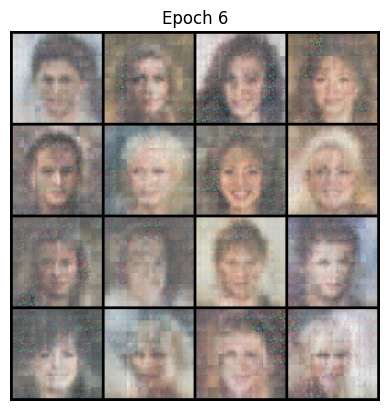

[Epoch 7/50] [Batch 0/396] [D loss: 0.5737911462783813] [G loss: 1.2297552824020386]
[Epoch 7/50] [Batch 100/396] [D loss: 0.6004385352134705] [G loss: 1.090619444847107]
[Epoch 7/50] [Batch 200/396] [D loss: 0.6028645634651184] [G loss: 1.088626742362976]
[Epoch 7/50] [Batch 300/396] [D loss: 0.6260466575622559] [G loss: 1.0306289196014404]


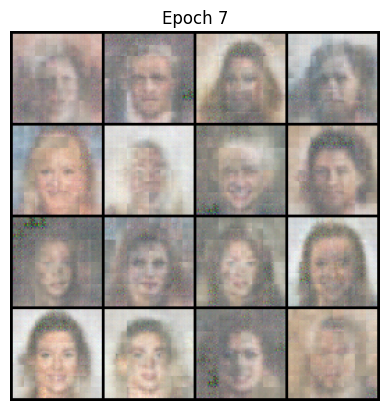

[Epoch 8/50] [Batch 0/396] [D loss: 0.6058616042137146] [G loss: 1.0007424354553223]
[Epoch 8/50] [Batch 100/396] [D loss: 0.615673303604126] [G loss: 1.1009118556976318]
[Epoch 8/50] [Batch 200/396] [D loss: 0.6291019916534424] [G loss: 1.049389362335205]
[Epoch 8/50] [Batch 300/396] [D loss: 0.6431182622909546] [G loss: 0.9413917064666748]


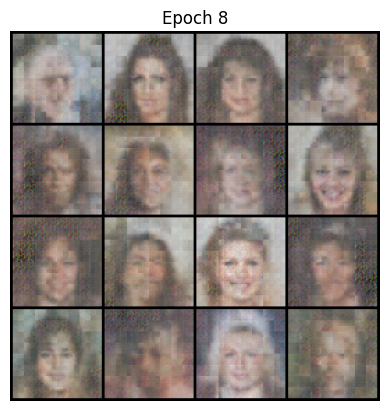

[Epoch 9/50] [Batch 0/396] [D loss: 0.6674739718437195] [G loss: 1.74202299118042]
[Epoch 9/50] [Batch 100/396] [D loss: 0.6406524777412415] [G loss: 1.1366158723831177]
[Epoch 9/50] [Batch 200/396] [D loss: 0.6327305436134338] [G loss: 1.07219398021698]
[Epoch 9/50] [Batch 300/396] [D loss: 0.6625648736953735] [G loss: 0.9323081970214844]


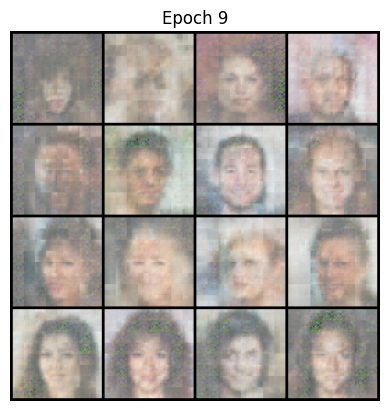

[Epoch 10/50] [Batch 0/396] [D loss: 0.7019067406654358] [G loss: 1.0883078575134277]
[Epoch 10/50] [Batch 100/396] [D loss: 0.9445240497589111] [G loss: 1.1144465208053589]
[Epoch 10/50] [Batch 200/396] [D loss: 0.5825020670890808] [G loss: 1.089617371559143]
[Epoch 10/50] [Batch 300/396] [D loss: 0.636091947555542] [G loss: 1.0639965534210205]


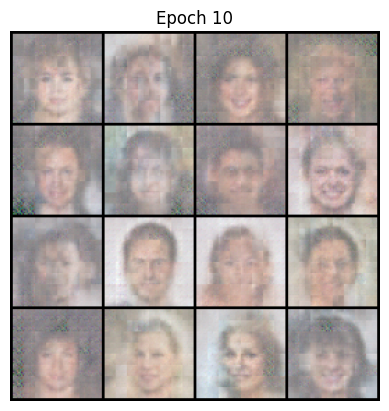

[Epoch 11/50] [Batch 0/396] [D loss: 0.693599283695221] [G loss: 1.1616969108581543]
[Epoch 11/50] [Batch 100/396] [D loss: 0.6257138252258301] [G loss: 0.8349288702011108]
[Epoch 11/50] [Batch 200/396] [D loss: 0.6713927984237671] [G loss: 1.075104832649231]
[Epoch 11/50] [Batch 300/396] [D loss: 0.6714087724685669] [G loss: 0.8938026428222656]


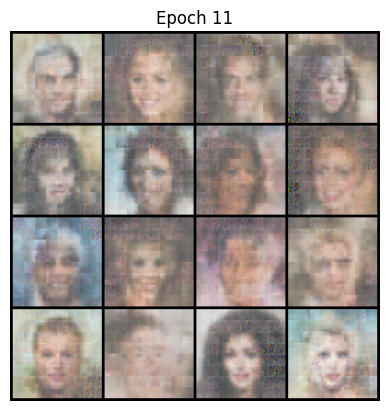

[Epoch 12/50] [Batch 0/396] [D loss: 0.6182693243026733] [G loss: 1.4656729698181152]
[Epoch 12/50] [Batch 100/396] [D loss: 0.6091082096099854] [G loss: 1.052347183227539]
[Epoch 12/50] [Batch 200/396] [D loss: 0.5888658761978149] [G loss: 1.0935707092285156]
[Epoch 12/50] [Batch 300/396] [D loss: 0.6480959057807922] [G loss: 1.027590036392212]


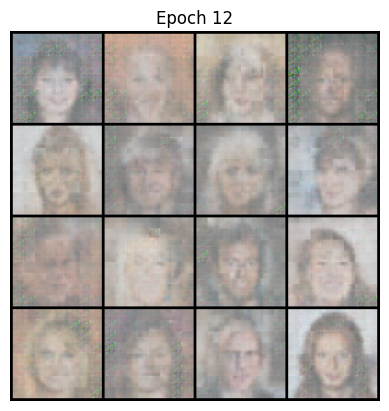

[Epoch 13/50] [Batch 0/396] [D loss: 0.655579686164856] [G loss: 0.9496363401412964]
[Epoch 13/50] [Batch 100/396] [D loss: 0.5991945862770081] [G loss: 1.1717966794967651]
[Epoch 13/50] [Batch 200/396] [D loss: 0.6020724773406982] [G loss: 1.0158538818359375]
[Epoch 13/50] [Batch 300/396] [D loss: 0.6171631813049316] [G loss: 0.993419885635376]


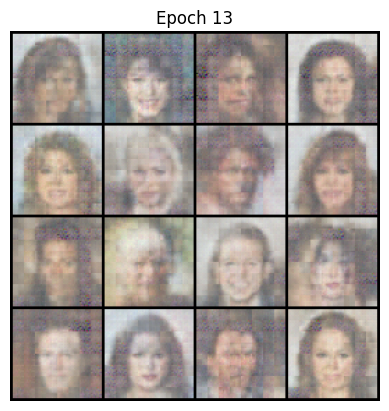

[Epoch 14/50] [Batch 0/396] [D loss: 0.6560187339782715] [G loss: 1.1282458305358887]
[Epoch 14/50] [Batch 100/396] [D loss: 0.6155507564544678] [G loss: 1.0158382654190063]
[Epoch 14/50] [Batch 200/396] [D loss: 0.6475399136543274] [G loss: 1.0009163618087769]
[Epoch 14/50] [Batch 300/396] [D loss: 0.6485387086868286] [G loss: 0.992555558681488]


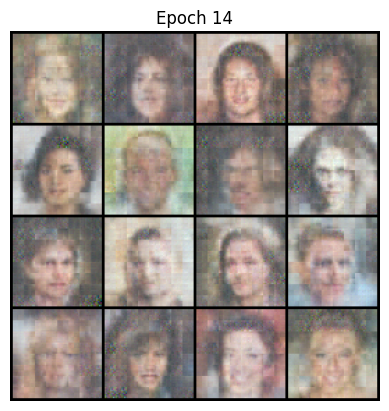

[Epoch 15/50] [Batch 0/396] [D loss: 0.6465132236480713] [G loss: 1.0927948951721191]
[Epoch 15/50] [Batch 100/396] [D loss: 0.6390597224235535] [G loss: 0.9404125213623047]
[Epoch 15/50] [Batch 200/396] [D loss: 0.6286555528640747] [G loss: 1.2133255004882812]
[Epoch 15/50] [Batch 300/396] [D loss: 0.6411290168762207] [G loss: 1.0210833549499512]


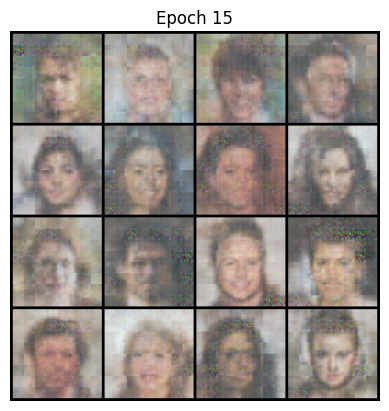

[Epoch 16/50] [Batch 0/396] [D loss: 0.6353156566619873] [G loss: 1.0941247940063477]
[Epoch 16/50] [Batch 100/396] [D loss: 0.6685952544212341] [G loss: 0.9558314085006714]
[Epoch 16/50] [Batch 200/396] [D loss: 0.6627309322357178] [G loss: 0.9252645373344421]
[Epoch 16/50] [Batch 300/396] [D loss: 0.6252624988555908] [G loss: 0.9484460353851318]


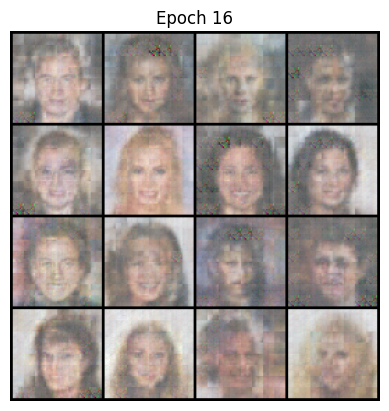

[Epoch 17/50] [Batch 0/396] [D loss: 0.604053258895874] [G loss: 0.9517438411712646]
[Epoch 17/50] [Batch 100/396] [D loss: 0.6343249082565308] [G loss: 0.8756769895553589]
[Epoch 17/50] [Batch 200/396] [D loss: 0.6342692375183105] [G loss: 0.9551355242729187]
[Epoch 17/50] [Batch 300/396] [D loss: 0.6018515229225159] [G loss: 0.9730775356292725]


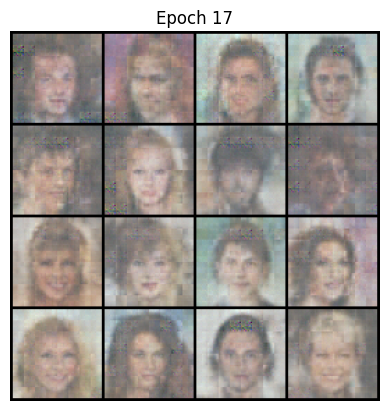

[Epoch 18/50] [Batch 0/396] [D loss: 0.6579583883285522] [G loss: 0.8853887915611267]
[Epoch 18/50] [Batch 100/396] [D loss: 0.6386460661888123] [G loss: 0.9538983702659607]
[Epoch 18/50] [Batch 200/396] [D loss: 0.650791347026825] [G loss: 0.9613155126571655]
[Epoch 18/50] [Batch 300/396] [D loss: 0.6599129438400269] [G loss: 1.000317931175232]


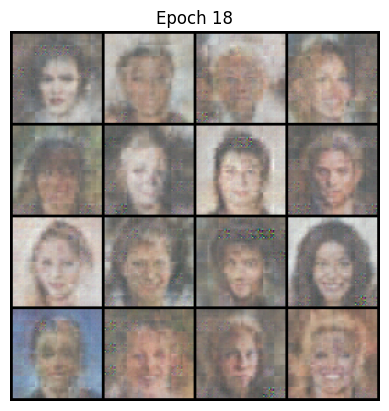

[Epoch 19/50] [Batch 0/396] [D loss: 0.6028565168380737] [G loss: 1.014671802520752]
[Epoch 19/50] [Batch 100/396] [D loss: 0.6107165217399597] [G loss: 0.9631680250167847]
[Epoch 19/50] [Batch 200/396] [D loss: 0.6436444520950317] [G loss: 1.0744102001190186]
[Epoch 19/50] [Batch 300/396] [D loss: 0.6118838787078857] [G loss: 1.0135385990142822]


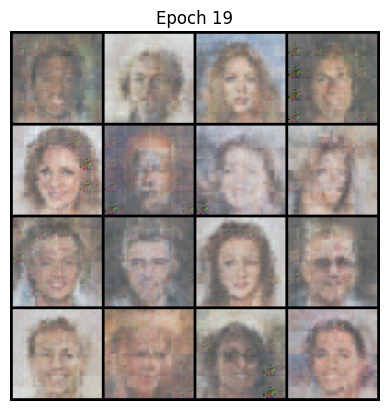

[Epoch 20/50] [Batch 0/396] [D loss: 0.6373136043548584] [G loss: 0.9295969009399414]
[Epoch 20/50] [Batch 100/396] [D loss: 0.6511845588684082] [G loss: 1.076507329940796]
[Epoch 20/50] [Batch 200/396] [D loss: 0.6459482908248901] [G loss: 1.201336145401001]
[Epoch 20/50] [Batch 300/396] [D loss: 0.6315748691558838] [G loss: 0.9760810136795044]


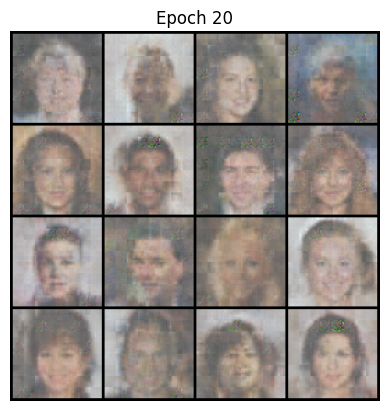

[Epoch 21/50] [Batch 0/396] [D loss: 0.6688724756240845] [G loss: 0.9997817873954773]
[Epoch 21/50] [Batch 100/396] [D loss: 0.6087617874145508] [G loss: 0.8656494617462158]
[Epoch 21/50] [Batch 200/396] [D loss: 0.6685731410980225] [G loss: 0.9230631589889526]
[Epoch 21/50] [Batch 300/396] [D loss: 0.6527373790740967] [G loss: 0.9696639776229858]


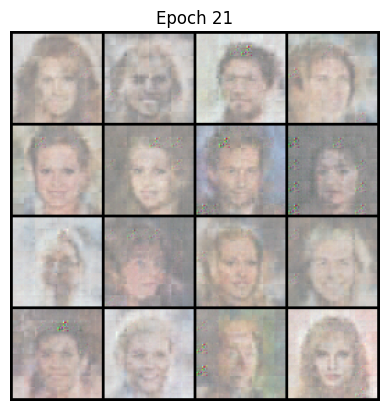

[Epoch 22/50] [Batch 0/396] [D loss: 0.6206708550453186] [G loss: 0.978270411491394]
[Epoch 22/50] [Batch 100/396] [D loss: 0.6243841648101807] [G loss: 1.0661067962646484]
[Epoch 22/50] [Batch 200/396] [D loss: 0.6231998801231384] [G loss: 1.021562933921814]
[Epoch 22/50] [Batch 300/396] [D loss: 0.648175835609436] [G loss: 0.9417707920074463]


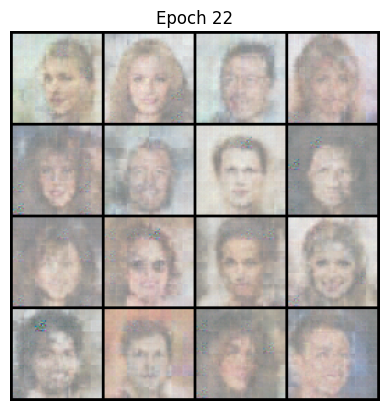

[Epoch 23/50] [Batch 0/396] [D loss: 0.640767514705658] [G loss: 1.0260319709777832]
[Epoch 23/50] [Batch 100/396] [D loss: 0.6238021850585938] [G loss: 0.8499996662139893]
[Epoch 23/50] [Batch 200/396] [D loss: 0.658920168876648] [G loss: 0.7216027975082397]
[Epoch 23/50] [Batch 300/396] [D loss: 0.5442343354225159] [G loss: 1.3146535158157349]


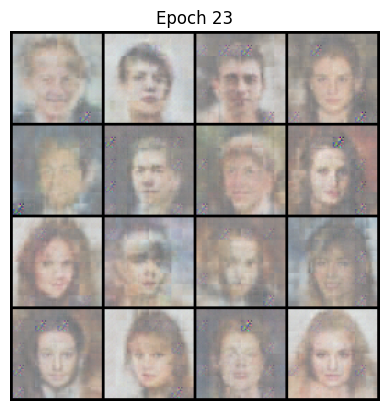

[Epoch 24/50] [Batch 0/396] [D loss: 0.6286329627037048] [G loss: 1.090165376663208]
[Epoch 24/50] [Batch 100/396] [D loss: 0.6111161708831787] [G loss: 0.9453890323638916]
[Epoch 24/50] [Batch 200/396] [D loss: 0.5534421801567078] [G loss: 1.1885685920715332]
[Epoch 24/50] [Batch 300/396] [D loss: 0.626534640789032] [G loss: 0.9972150325775146]


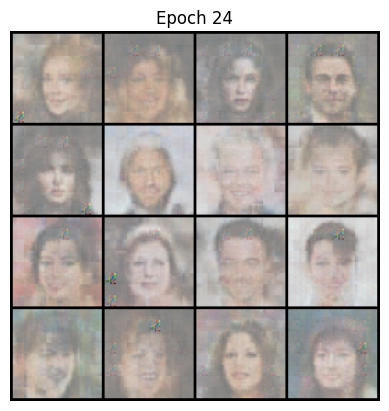

[Epoch 25/50] [Batch 0/396] [D loss: 0.558713436126709] [G loss: 1.2938530445098877]
[Epoch 25/50] [Batch 100/396] [D loss: 0.6005549430847168] [G loss: 0.9898104667663574]
[Epoch 25/50] [Batch 200/396] [D loss: 0.6124089360237122] [G loss: 1.0235105752944946]
[Epoch 25/50] [Batch 300/396] [D loss: 0.5672125816345215] [G loss: 1.115647792816162]


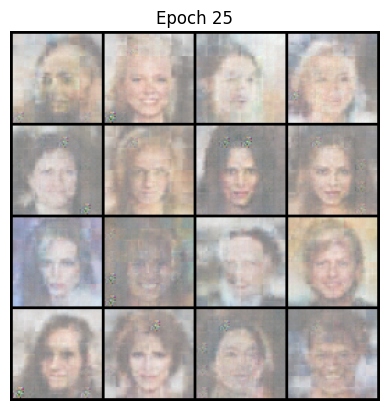

[Epoch 26/50] [Batch 0/396] [D loss: 0.6087327003479004] [G loss: 1.0324313640594482]
[Epoch 26/50] [Batch 100/396] [D loss: 0.5799271464347839] [G loss: 0.8965149521827698]
[Epoch 26/50] [Batch 200/396] [D loss: 0.5625840425491333] [G loss: 1.0789196491241455]
[Epoch 26/50] [Batch 300/396] [D loss: 0.3499506711959839] [G loss: 1.7267001867294312]


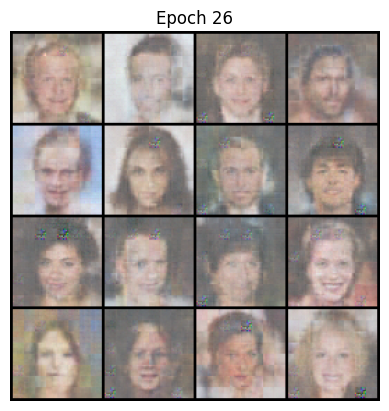

[Epoch 27/50] [Batch 0/396] [D loss: 0.5878494381904602] [G loss: 1.1954476833343506]
[Epoch 27/50] [Batch 100/396] [D loss: 0.8232470154762268] [G loss: 1.124026894569397]
[Epoch 27/50] [Batch 200/396] [D loss: 0.49380525946617126] [G loss: 1.317497968673706]
[Epoch 27/50] [Batch 300/396] [D loss: 0.5609713792800903] [G loss: 1.0646846294403076]


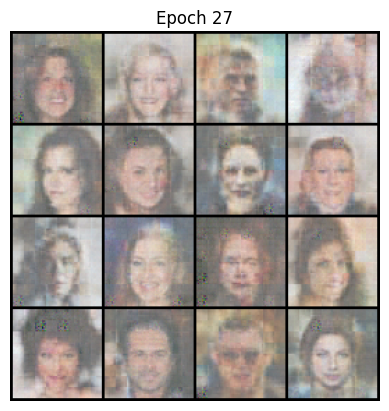

[Epoch 28/50] [Batch 0/396] [D loss: 0.48245131969451904] [G loss: 1.3827993869781494]
[Epoch 28/50] [Batch 100/396] [D loss: 0.5532224178314209] [G loss: 0.9223570823669434]
[Epoch 28/50] [Batch 200/396] [D loss: 0.48505038022994995] [G loss: 2.1787896156311035]
[Epoch 28/50] [Batch 300/396] [D loss: 0.5879020094871521] [G loss: 1.094222068786621]


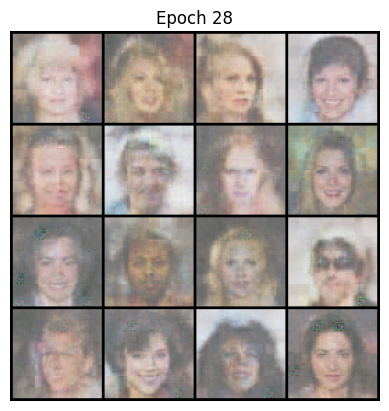

[Epoch 29/50] [Batch 0/396] [D loss: 0.5209243893623352] [G loss: 1.22756028175354]
[Epoch 29/50] [Batch 100/396] [D loss: 0.4946806728839874] [G loss: 1.4447392225265503]
[Epoch 29/50] [Batch 200/396] [D loss: 0.5136525630950928] [G loss: 1.460052490234375]
[Epoch 29/50] [Batch 300/396] [D loss: 0.5444467663764954] [G loss: 1.0464956760406494]


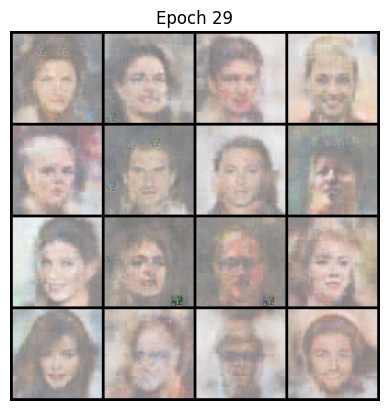

[Epoch 30/50] [Batch 0/396] [D loss: 0.5348753333091736] [G loss: 1.1477608680725098]
[Epoch 30/50] [Batch 100/396] [D loss: 0.5627013444900513] [G loss: 1.0897302627563477]
[Epoch 30/50] [Batch 200/396] [D loss: 0.6554398536682129] [G loss: 1.1315455436706543]
[Epoch 30/50] [Batch 300/396] [D loss: 0.5091779232025146] [G loss: 1.3321188688278198]


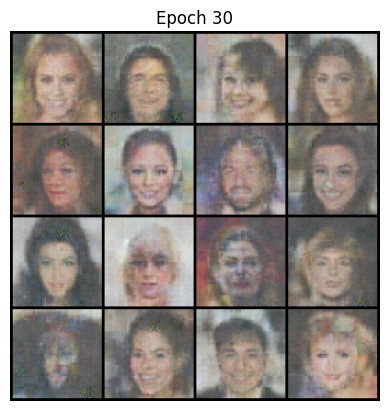

[Epoch 31/50] [Batch 0/396] [D loss: 0.5309087038040161] [G loss: 1.3352220058441162]
[Epoch 31/50] [Batch 100/396] [D loss: 0.44014212489128113] [G loss: 1.2620024681091309]
[Epoch 31/50] [Batch 200/396] [D loss: 0.4725024998188019] [G loss: 1.8898310661315918]
[Epoch 31/50] [Batch 300/396] [D loss: 0.5677827596664429] [G loss: 1.4619600772857666]


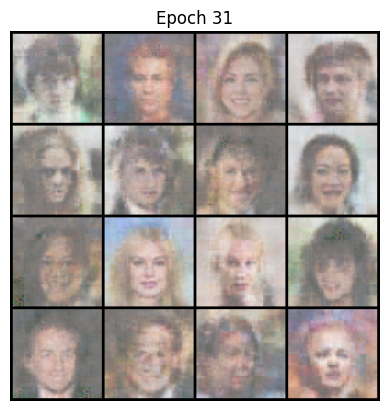

[Epoch 32/50] [Batch 0/396] [D loss: 0.520730197429657] [G loss: 1.1971596479415894]
[Epoch 32/50] [Batch 100/396] [D loss: 0.7992854118347168] [G loss: 2.5936388969421387]
[Epoch 32/50] [Batch 200/396] [D loss: 0.5161525011062622] [G loss: 1.5163713693618774]
[Epoch 32/50] [Batch 300/396] [D loss: 0.447126567363739] [G loss: 1.3028202056884766]


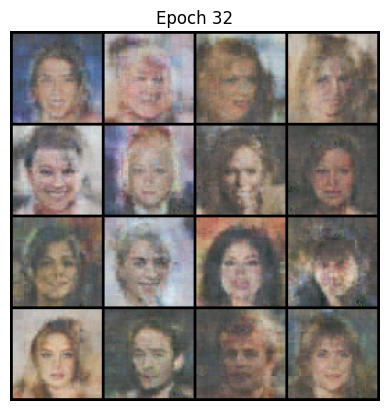

[Epoch 33/50] [Batch 0/396] [D loss: 0.560147762298584] [G loss: 0.9318139553070068]
[Epoch 33/50] [Batch 100/396] [D loss: 0.545434832572937] [G loss: 1.0911301374435425]
[Epoch 33/50] [Batch 200/396] [D loss: 0.5664474964141846] [G loss: 1.1681582927703857]
[Epoch 33/50] [Batch 300/396] [D loss: 0.4734901189804077] [G loss: 1.4265878200531006]


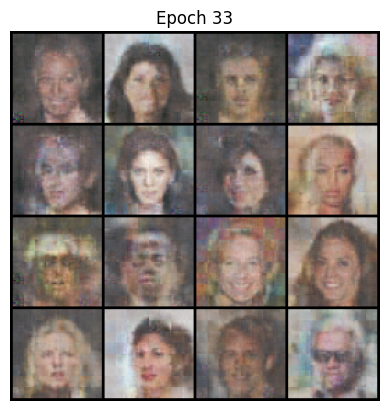

[Epoch 34/50] [Batch 0/396] [D loss: 0.4937819242477417] [G loss: 1.3235621452331543]
[Epoch 34/50] [Batch 100/396] [D loss: 0.6117371916770935] [G loss: 1.390474796295166]
[Epoch 34/50] [Batch 200/396] [D loss: 0.4926547706127167] [G loss: 1.4442203044891357]
[Epoch 34/50] [Batch 300/396] [D loss: 0.5161658525466919] [G loss: 1.5548902750015259]


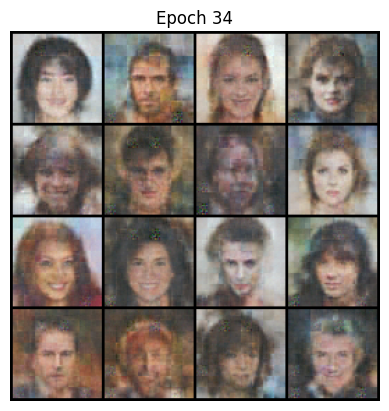

[Epoch 35/50] [Batch 0/396] [D loss: 0.414507120847702] [G loss: 1.8636412620544434]
[Epoch 35/50] [Batch 100/396] [D loss: 0.5611369609832764] [G loss: 0.9690748453140259]
[Epoch 35/50] [Batch 200/396] [D loss: 0.47733166813850403] [G loss: 1.1639790534973145]
[Epoch 35/50] [Batch 300/396] [D loss: 0.5378516912460327] [G loss: 1.2047512531280518]


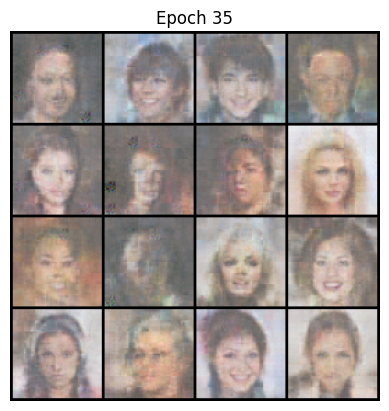

[Epoch 36/50] [Batch 0/396] [D loss: 0.3459847867488861] [G loss: 1.651820182800293]
[Epoch 36/50] [Batch 100/396] [D loss: 0.4615499973297119] [G loss: 2.056196928024292]
[Epoch 36/50] [Batch 200/396] [D loss: 0.33752506971359253] [G loss: 1.9353973865509033]
[Epoch 36/50] [Batch 300/396] [D loss: 0.5101368427276611] [G loss: 1.3567004203796387]


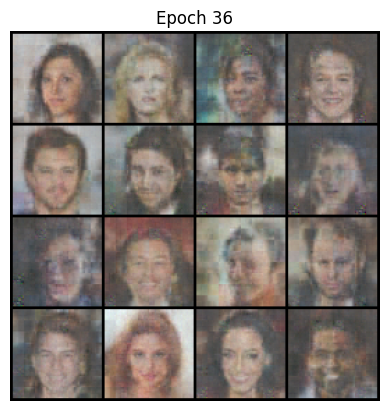

[Epoch 37/50] [Batch 0/396] [D loss: 0.42436549067497253] [G loss: 1.8065500259399414]
[Epoch 37/50] [Batch 100/396] [D loss: 0.44360944628715515] [G loss: 1.4736754894256592]
[Epoch 37/50] [Batch 200/396] [D loss: 0.48428475856781006] [G loss: 1.471335768699646]
[Epoch 37/50] [Batch 300/396] [D loss: 0.48291051387786865] [G loss: 1.4378340244293213]


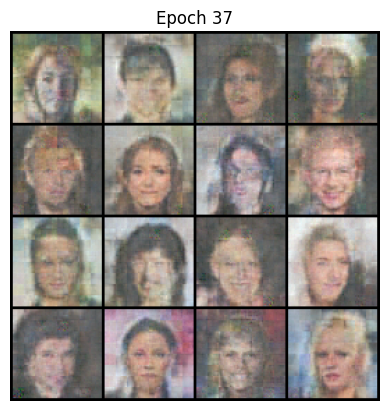

[Epoch 38/50] [Batch 0/396] [D loss: 0.4428268074989319] [G loss: 2.2640774250030518]
[Epoch 38/50] [Batch 100/396] [D loss: 0.5573884844779968] [G loss: 1.3017449378967285]
[Epoch 38/50] [Batch 200/396] [D loss: 0.5070546865463257] [G loss: 1.4649794101715088]
[Epoch 38/50] [Batch 300/396] [D loss: 0.4828745722770691] [G loss: 1.228528380393982]


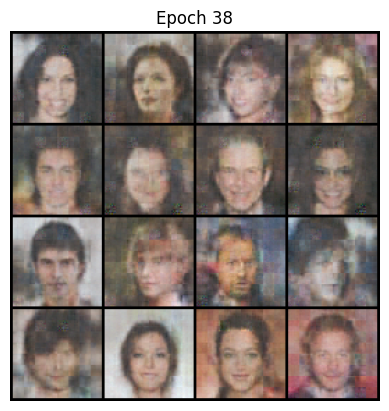

[Epoch 39/50] [Batch 0/396] [D loss: 0.48056721687316895] [G loss: 1.3206498622894287]
[Epoch 39/50] [Batch 100/396] [D loss: 0.39834749698638916] [G loss: 1.513692021369934]
[Epoch 39/50] [Batch 200/396] [D loss: 0.4175575375556946] [G loss: 1.7078897953033447]
[Epoch 39/50] [Batch 300/396] [D loss: 0.4577503204345703] [G loss: 1.6766879558563232]


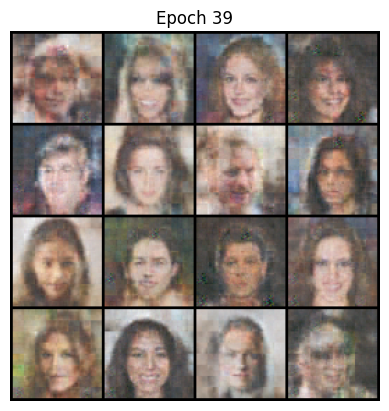

[Epoch 40/50] [Batch 0/396] [D loss: 0.4904191195964813] [G loss: 1.2326384782791138]
[Epoch 40/50] [Batch 100/396] [D loss: 0.44483518600463867] [G loss: 1.3158085346221924]
[Epoch 40/50] [Batch 200/396] [D loss: 0.38953322172164917] [G loss: 1.4925096035003662]
[Epoch 40/50] [Batch 300/396] [D loss: 0.40384477376937866] [G loss: 1.6405329704284668]


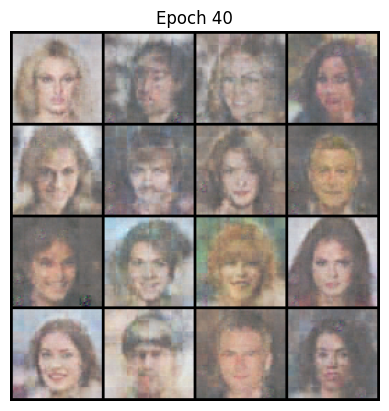

[Epoch 41/50] [Batch 0/396] [D loss: 0.4578009247779846] [G loss: 1.4965064525604248]
[Epoch 41/50] [Batch 100/396] [D loss: 0.494145929813385] [G loss: 1.265486717224121]
[Epoch 41/50] [Batch 200/396] [D loss: 0.3596494495868683] [G loss: 1.9550697803497314]
[Epoch 41/50] [Batch 300/396] [D loss: 0.5129947662353516] [G loss: 1.6370521783828735]


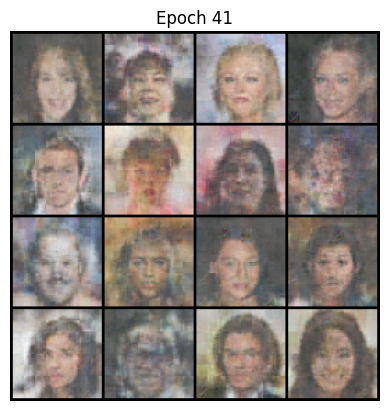

[Epoch 42/50] [Batch 0/396] [D loss: 0.6405043005943298] [G loss: 1.4932494163513184]
[Epoch 42/50] [Batch 100/396] [D loss: 0.35307684540748596] [G loss: 2.4546117782592773]
[Epoch 42/50] [Batch 200/396] [D loss: 0.5486001968383789] [G loss: 1.2572314739227295]
[Epoch 42/50] [Batch 300/396] [D loss: 0.40673747658729553] [G loss: 1.6082881689071655]


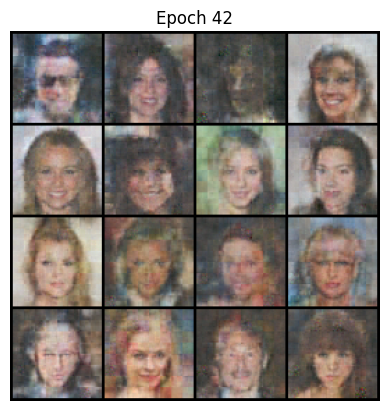

[Epoch 43/50] [Batch 0/396] [D loss: 0.38048169016838074] [G loss: 1.734919786453247]
[Epoch 43/50] [Batch 100/396] [D loss: 0.5577647089958191] [G loss: 1.9289674758911133]
[Epoch 43/50] [Batch 200/396] [D loss: 0.39758265018463135] [G loss: 1.666597843170166]
[Epoch 43/50] [Batch 300/396] [D loss: 0.37234240770339966] [G loss: 1.6529631614685059]


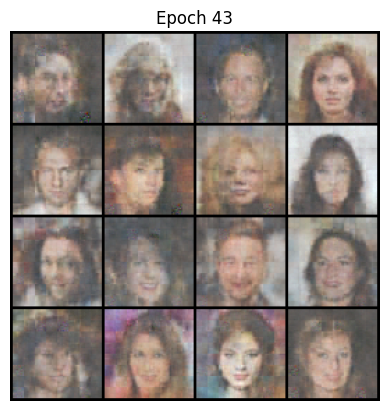

[Epoch 44/50] [Batch 0/396] [D loss: 0.3024538457393646] [G loss: 2.451676845550537]
[Epoch 44/50] [Batch 100/396] [D loss: 0.4330364167690277] [G loss: 1.849537968635559]
[Epoch 44/50] [Batch 200/396] [D loss: 0.37513017654418945] [G loss: 1.7311644554138184]
[Epoch 44/50] [Batch 300/396] [D loss: 0.3256722688674927] [G loss: 1.5097086429595947]


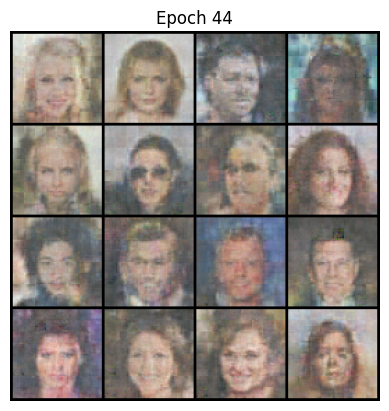

[Epoch 45/50] [Batch 0/396] [D loss: 0.5315587520599365] [G loss: 1.5073027610778809]
[Epoch 45/50] [Batch 100/396] [D loss: 0.38549700379371643] [G loss: 1.7318909168243408]
[Epoch 45/50] [Batch 200/396] [D loss: 0.5818977355957031] [G loss: 1.7608697414398193]
[Epoch 45/50] [Batch 300/396] [D loss: 0.49099212884902954] [G loss: 1.9828600883483887]


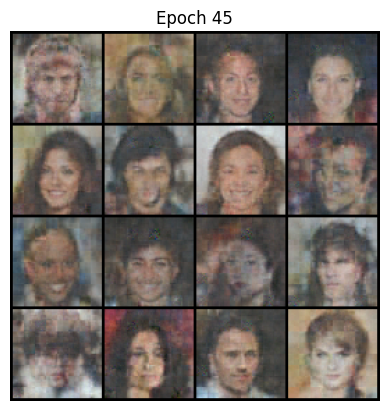

[Epoch 46/50] [Batch 0/396] [D loss: 0.35592859983444214] [G loss: 2.696526527404785]
[Epoch 46/50] [Batch 100/396] [D loss: 0.3979126214981079] [G loss: 2.236708641052246]
[Epoch 46/50] [Batch 200/396] [D loss: 0.5700068473815918] [G loss: 1.41116201877594]
[Epoch 46/50] [Batch 300/396] [D loss: 0.6131017804145813] [G loss: 2.0554447174072266]


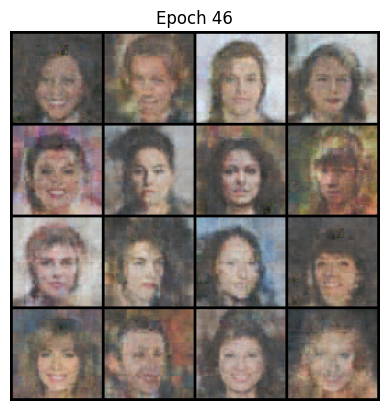

[Epoch 47/50] [Batch 0/396] [D loss: 0.39096444845199585] [G loss: 1.6873621940612793]
[Epoch 47/50] [Batch 100/396] [D loss: 0.38253253698349] [G loss: 2.294372081756592]
[Epoch 47/50] [Batch 200/396] [D loss: 0.4701688885688782] [G loss: 1.6620824337005615]
[Epoch 47/50] [Batch 300/396] [D loss: 0.37568289041519165] [G loss: 1.6775214672088623]


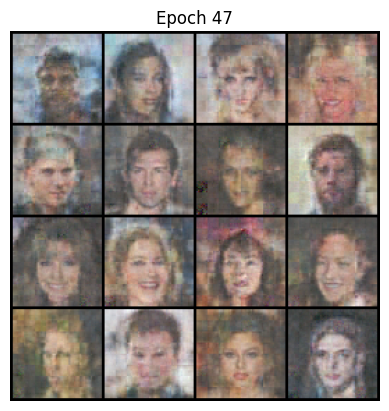

[Epoch 48/50] [Batch 0/396] [D loss: 0.39565858244895935] [G loss: 1.5895024538040161]
[Epoch 48/50] [Batch 100/396] [D loss: 0.4088468551635742] [G loss: 1.3628308773040771]
[Epoch 48/50] [Batch 200/396] [D loss: 0.2656492590904236] [G loss: 1.91559636592865]
[Epoch 48/50] [Batch 300/396] [D loss: 0.43457886576652527] [G loss: 1.5943472385406494]


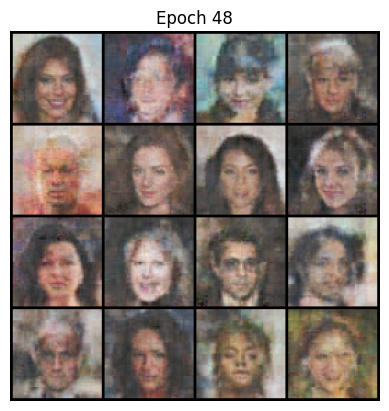

[Epoch 49/50] [Batch 0/396] [D loss: 0.47193440794944763] [G loss: 1.9588862657546997]
[Epoch 49/50] [Batch 100/396] [D loss: 0.4894441068172455] [G loss: 1.3378199338912964]
[Epoch 49/50] [Batch 200/396] [D loss: 0.6764853000640869] [G loss: 3.0832953453063965]
[Epoch 49/50] [Batch 300/396] [D loss: 0.4590727984905243] [G loss: 2.2295868396759033]


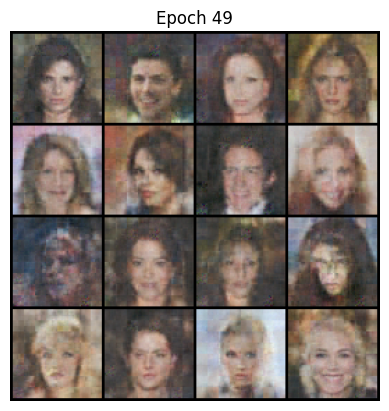

In [12]:
train(generator, discriminator, dataloader, epochs=50)

In [13]:
import torch

model_path = "/kaggle/working/trained_model"

try:
    torch.save(model.state_dict(), model_path + ".pth")
    print("Model saved successfully (PyTorch format).")
except:
    pass

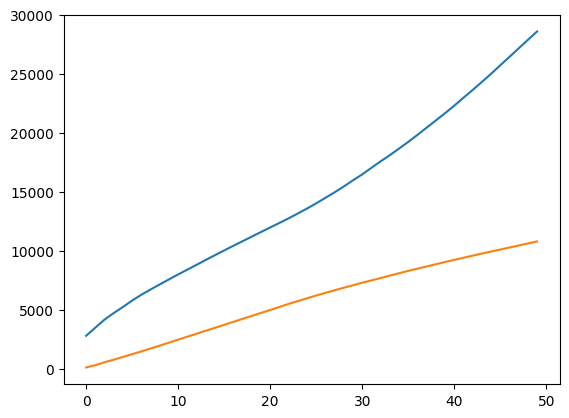

In [14]:
plt.plot(g_accumulated_loss)
plt.plot(d_accumulated_loss)
plt.show()

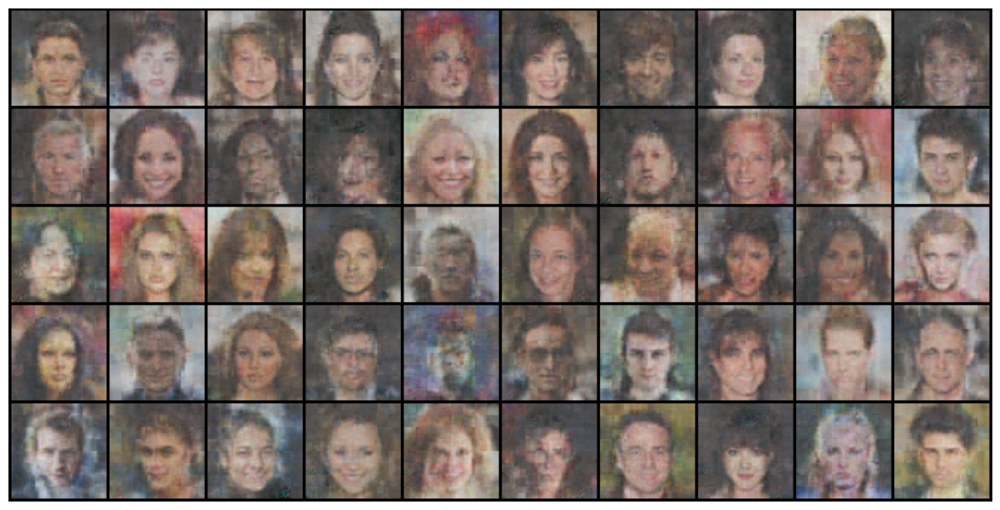

In [15]:
import torch
import torchvision.utils as vutils
import matplotlib.pyplot as plt

z_dim = 100
z = torch.randn(50, z_dim).to(device)

generator.eval()
with torch.no_grad():
    generated_imgs = generator(z).cpu()

grid = vutils.make_grid(generated_imgs, nrow=10, normalize=True)
plt.figure(figsize=(15, 10))
plt.imshow(grid.permute(1, 2, 0))
plt.axis("off")
plt.show()